# Social Network Analysis Project


The aim of the project is to provide descriptive analysis for my social ego-network. I will use Vkontakte social network. I need to collect data from it and create my ego network.

In [164]:
import vk
import json
import time
from tqdm import tqdm

import pandas as pd
import numpy as np

import networkx as nx
import matplotlib.pyplot as plt
import time
from sklearn.linear_model import LinearRegression
from typing import Dict, List
import matplotlib.colors as mcolors

from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.ticker as ticker

In [165]:
token= "03fada06736faaf31f616915c53fcb43562b838e631f182d4b8eaeac5d4c72ac9bacbf1aeecdf4432e807"
session = vk.Session(access_token = token)
api = vk.API(session)

my_id = 121384234

## Uploading data

In [166]:
def load_friends_list(my_id):
    responce = str(api.friends.get(count=209, user_id = my_id, fields = "bdate, city, sex", v='5.95'))
    responce = responce.replace("'", '"')
    responce = responce.replace("False", '"False"')
    responce = responce.replace("True", '"True"')
    return json.loads(responce)['items']

def create_edges(nodes, my_id):
    edges = []
    for node in nodes:
        mut_friends = api.friends.getMutual(source_uid=my_id, target_uid=node, v='5.95')
        for i in mut_friends:
            edges.append((node, i))
        time.sleep(1) 
    edges_uniq = list(set(tuple(set(x)) for x in edges))
    return edges_uniq

In [167]:
# getting data about each friend
friends_list = load_friends_list(my_id)
friends_list

[{'first_name': 'Алексей',
  'id': 425475,
  'last_name': 'Раков',
  'can_access_closed': 'True',
  'is_closed': 'False',
  'sex': 2,
  'bdate': '12.8',
  'city': {'id': 459, 'title': 'Реутов'},
  'can_invite_to_chats': 'False',
  'track_code': 'ccf30088CglrD6vEGaS1gbKJJDqvFoFlV5SCSo40FX_iwQBkBH9nYmU9ncAd8rHVh0uQyCh89nEl_Q'},
 {'first_name': 'Левон',
  'id': 582173,
  'last_name': 'Захарян',
  'can_access_closed': 'True',
  'is_closed': 'False',
  'sex': 2,
  'bdate': '12.7',
  'city': {'id': 2, 'title': 'Санкт-Петербург'},
  'can_invite_to_chats': 'False',
  'track_code': 'a2495de0OgMEFsPyXj9xSsE9CY2YLGMz3kHwqSNl5dXp09UJe8tXaFgipPNTa3hO8_-9fx9GFCesKA'},
 {'first_name': 'Дмитрий',
  'id': 640899,
  'last_name': 'Широков',
  'can_access_closed': 'True',
  'is_closed': 'False',
  'sex': 2,
  'bdate': '5.5',
  'city': {'id': 1, 'title': 'Москва'},
  'can_invite_to_chats': 'False',
  'track_code': '70e7373fOwAFMu0dE3_Zb1qjxhPYFW0Yt3nzFLdNocF2TvhaE8tWawoE2R4XdtVgYWFy4V9_GgzFEA'},
 {'first_n

In [168]:
# getting my friends unique ids
nodes = [friend['id'] for friend in friends_list]
print(nodes)
len(nodes)

[425475, 582173, 640899, 4318766, 6956830, 8469731, 10274311, 11094314, 12488209, 16137150, 16599619, 16889823, 16904643, 17161002, 17211345, 17861104, 18793223, 19243810, 23033972, 25562542, 28035424, 28972609, 29633605, 30064032, 30416820, 32203540, 32449631, 37618466, 43730418, 43912053, 51622225, 55884688, 60973165, 61532674, 62306129, 62628026, 66879727, 67939561, 68954718, 70821668, 71980080, 72516194, 76422655, 78534017, 80138700, 82462599, 82983214, 84048956, 85449521, 86941610, 87196909, 91703523, 91785844, 92093984, 94329861, 108527335, 111956024, 118765387, 132461050, 136037603, 139900037, 141270449, 144101986, 145231523, 149074920, 151642694, 156455031, 157916944, 160497002, 161723360, 163251850, 167617321, 171752155, 174310034, 180557499, 192136436, 193038708, 197822306, 199371517, 209253560, 215203609, 225452128, 228525915, 230588576, 238173402, 242644466, 257900645, 272694230, 288167122, 288488898, 293831245, 299476358, 299478669, 302148526, 307785192, 316551627, 3327391

100

In [169]:
# getting edges of connected mutual friends of mine
edges = create_edges(nodes, my_id)
edges

[(82983214, 6956830),
 (28972609, 242644466),
 (51622225, 4318766),
 (62306129, 199371517),
 (92093984, 32449631),
 (37618466, 82462599),
 (55884688, 167617321),
 (37618466, 19243810),
 (238173402, 16904643),
 (51622225, 238173402),
 (6956830, 76422655),
 (60973165, 87196909),
 (582173, 43912053),
 (6956830, 16889823),
 (92093984, 82462599),
 (167617321, 43730418),
 (92093984, 61532674),
 (30416820, 87196909),
 (16904643, 257900645),
 (139900037, 299478669),
 (215203609, 16904643),
 (28972609, 192136436),
 (161723360, 230588576),
 (25562542, 16889823),
 (288167122, 19243810),
 (230588576, 132461050),
 (23033972, 87196909),
 (167617321, 215203609),
 (209253560, 299476358),
 (92093984, 10274311),
 (61532674, 76422655),
 (6956830, 32449631),
 (61532674, 16889823),
 (71980080, 23033972),
 (68954718, 151642694),
 (72516194, 299478669),
 (51622225, 16904643),
 (80138700, 91785844),
 (132461050, 80138700),
 (6956830, 82462599),
 (257900645, 32449631),
 (85449521, 87196909),
 (307785192, 13246

Now I need to turn this data a parsed into networkx graph

In [170]:
G = nx.Graph()
G.add_nodes_from(nodes)
G.add_edges_from(edges)

I want to replace those ids with my friends full names

In [171]:
mapping = {}
for i in range(len(nodes)):
    mapping[list(G.nodes)[i]] = str(friends_list[i]["first_name"])+ " " + str(friends_list[i]["last_name"])


In [172]:
G = nx.relabel_nodes(G, mapping)

For more appealing and comfortable visualization, I am going to use Kamada-Kawai graph

In [173]:
layout_G = nx.kamada_kawai_layout(G)

Plotting a grpah

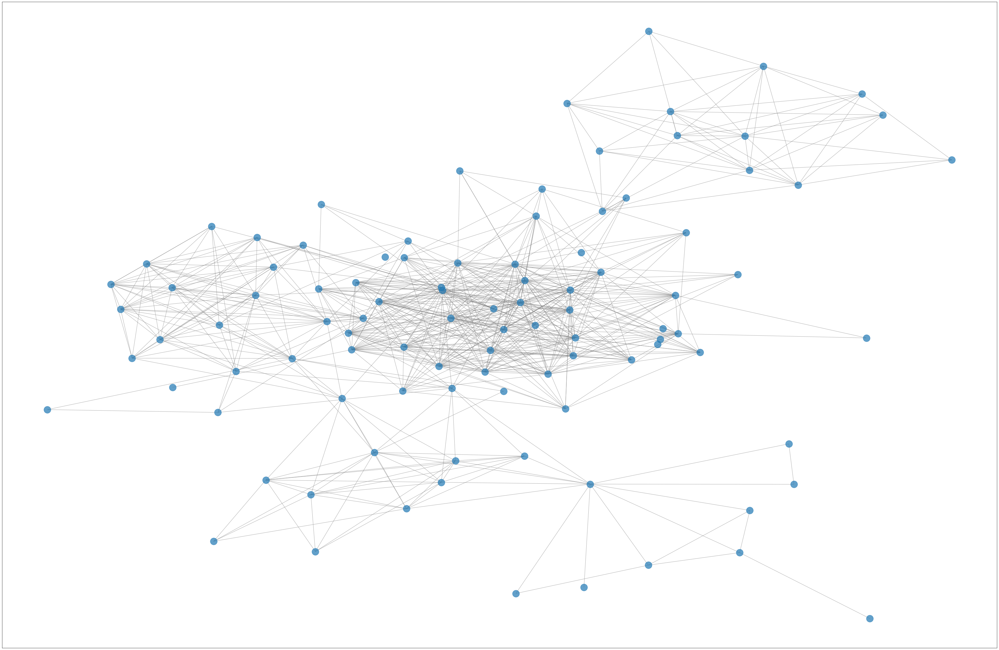

In [174]:
plt.figure(figsize=(60,40))
# Plot it
nx.draw_networkx(
    G, with_labels=False, node_size=550,
     alpha=0.7, pos = layout_G,
    edge_color="gray"
)
plt.show()

Lets look at it without friend which dont have any mutual firend with me

In [175]:
node_degree_dict=nx.degree(G)
G2=nx.subgraph(G,[x for x in G.nodes() if node_degree_dict[x]!=0])

In [176]:
G2 = nx.relabel_nodes(G2, mapping)

In [177]:
layout_G2 = nx.kamada_kawai_layout(G2)

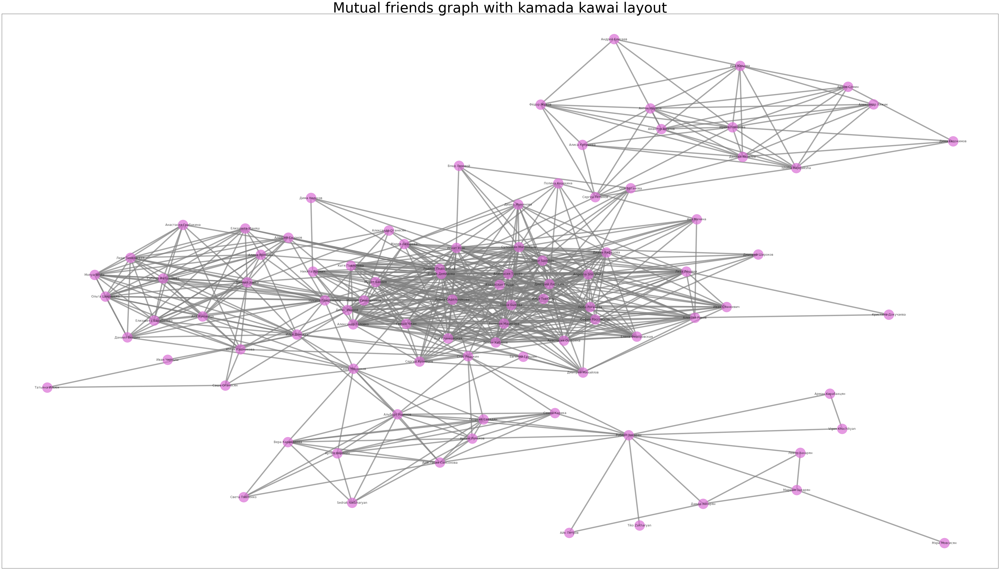

In [178]:
plt.figure(figsize=(70,40))
# Plot it
plt.title("Mutual friends graph with kamada kawai layout", fontsize=55)
nx.draw_networkx(
    G2, with_labels=True, node_size=1550,width = 5,
     alpha=0.7,node_color='#DA70D6', pos = layout_G2,
    edge_color="gray"
)
plt.show()

In [179]:
# sum basic info about created graph
print("Number of nodes: ", len(G2.nodes))
print("Number of edges: ", len(G2.edges))

Number of nodes:  94
Number of edges:  598


For further analysis, the second graph is more suitable

## Network Summary

I will calculate some basic statistics. As can be seen, I also removed myself from that ego-graph graph before, since I would be the most central person and analysis would be biased.

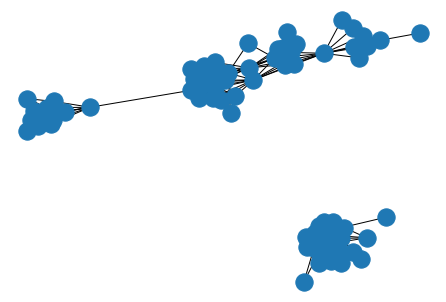

In [180]:
nx.draw(G2, with_labels = False)

However, as can be seen there are somу components in graph, which are not connected. So I'm going to calculate statistics on giant component

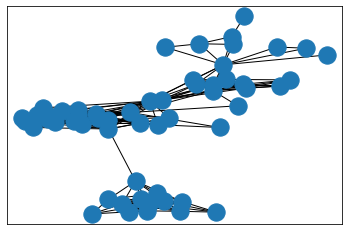

In [181]:
giant = max(nx.connected_components(G2), key=len)
G2_sub = G2.subgraph(giant)
nx.draw_networkx(G2_sub, with_labels = False)

In [182]:
print('Radius: ', round(nx.radius(G2_sub), 3))
print('Diameter: ', round(nx.diameter(G2_sub), 3))
print('Transitivity of a graph (global clustering coefficient): ', round(nx.transitivity(G2_sub), 3))
print('Average clustering coefficient: ', round(nx.average_clustering(G2_sub), 3))
print('Average shortest path length: ', round(nx.average_shortest_path_length(G2_sub), 3))

Radius:  4
Diameter:  7
Transitivity of a graph (global clustering coefficient):  0.627
Average clustering coefficient:  0.684
Average shortest path length:  2.997


Lets visualize this graph as circle graph 

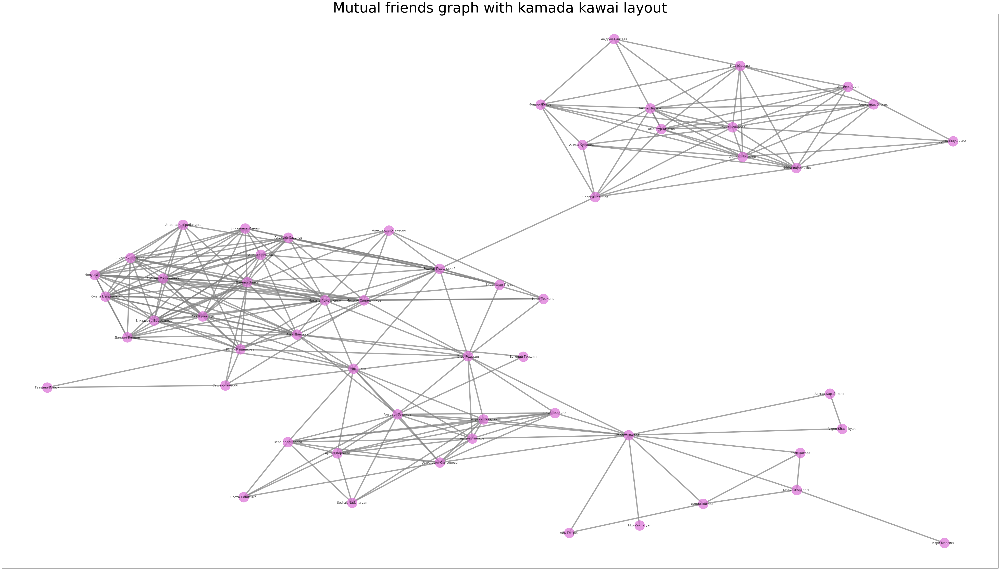

In [183]:
plt.figure(figsize=(70,40))
# Plot it
plt.title("Mutual friends graph with kamada kawai layout", fontsize=55)
nx.draw_networkx(
    G2_sub, with_labels=True, node_size=1550,width = 5,
     alpha=0.7,node_color='#DA70D6', pos = layout_G2,
    edge_color="gray"
)
plt.show()

The distrubutions of Local clustering coefficient and Shortest path lengths

Text(0, 0.5, 'Number of nodes')

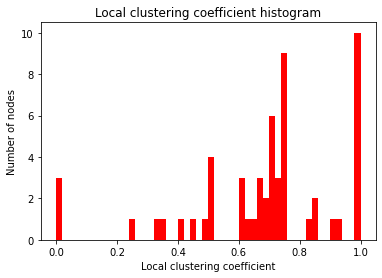

In [184]:
clustering = nx.clustering(G2_sub)
nodelist, node_sizes = zip(*dict(clustering).items())
n, bins, patches = plt.hist(np.array(node_sizes), bins = 50, facecolor='r')
plt.title("Local clustering coefficient histogram")
plt.xlabel("Local clustering coefficient")
plt.ylabel("Number of nodes")

Text(0, 0.5, 'Number of nodes')

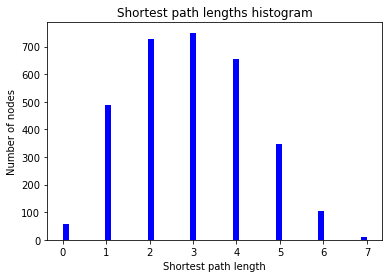

In [185]:
shortest_path_length = []
for i in dict(nx.shortest_path_length(G2_sub)).values():
    for j in i.values():
        shortest_path_length.append(j)
        
n, bins, patches = plt.hist(np.array(shortest_path_length), bins = 50, facecolor='b')
plt.title("Shortest path lengths histogram")
plt.xlabel("Shortest path length")
plt.ylabel("Number of nodes")

## Structural Analysis

Lets find out which one of the most popular models is the closest to our: Erdos-Renyi; Barabasi-Albert; Watts-Strogatz

$\textbf{Erdos-Renyi:}$

In [186]:
def random_edges(nodes, p):
    edge_list = []
    
    for i in range(len(nodes)):
        for j in range(i+1, len(nodes)):
            r = np.random.uniform(0,1)
            if r < p:
                edge_list.append((nodes[i], nodes[j]))
    return np.array(edge_list)

def erdos_renyi_graph(n, p):
    G = nx.Graph()
    nodes = np.arange(n)
    G.add_nodes_from(nodes)
    G.add_edges_from(random_edges(nodes, p))
    return G

def random_from_real(graph):
    n = len(graph.nodes)
    k_avg = sum(degree[1] for degree in graph.degree)/n
    
    return erdos_renyi_graph(n, k_avg/(n-1))

In [187]:
erdos_renyi = random_from_real(G2_sub)


$\textbf{Barabasi-Albert:}$

In [188]:
def barabasi(graph):
    node_sizes=[]
    for node in graph:
        node_sizes.append(graph.degree(node))
    mean_deg = np.mean(list(dict(graph.degree).values()))
    nodes_number = len(graph)
    m = np.mean(list(dict(graph.degree).values()))
    new_g = nx.generators.random_graphs.barabasi_albert_graph(nodes_number, int((m/2)+1))
    return new_g

In [189]:
barabasi_graph = barabasi(G2_sub)


$\textbf{Watts-Strogatz:}$

In [190]:
def watts(graph):
    node_sizes=[]
    for node in graph:
        node_sizes.append(graph.degree(node))
    #mean_deg = np.mean(node_sizes)
    mean_deg = np.mean(list(dict(graph.degree).values()))
    #nodes_number = np.size(node_sizes)
    nodes_number = len(graph)
    k=np.mean(list(dict(graph.degree).values()))
    p=0.05
    new_g = nx.generators.random_graphs.watts_strogatz_graph(nodes_number, int(k), p)
    return new_g

In [191]:
watts_graph = watts(G2_sub)


In [192]:
def statistics_table(G2_sub):
    lst = []
    # my model
    lst.append([round(nx.radius(G2_sub), 3), round(nx.diameter(G2_sub),3), 
                    round(nx.transitivity(G2_sub),3),round(nx.average_clustering(G2_sub),3), 
                    round(nx.average_shortest_path_length(G2_sub), 3)])
    
    # 𝐄𝐫𝐝𝐨𝐬-𝐑𝐞𝐧𝐲𝐢
    erdos_renyi = random_from_real(G2_sub)
    
    lst.append([round(nx.radius(erdos_renyi), 3), round(nx.diameter(erdos_renyi),3), 
                round(nx.transitivity(erdos_renyi),3),round(nx.average_clustering(erdos_renyi),3), 
                round(nx.average_shortest_path_length(erdos_renyi), 3)])
    
    # 𝐁𝐚𝐫𝐚𝐛𝐚𝐬𝐢-𝐀𝐥𝐛𝐞𝐫𝐭
    barabasi_graph = barabasi(G2_sub)
    
    lst.append([round(nx.radius(barabasi_graph), 3), round(nx.diameter(barabasi_graph),3), 
                round(nx.transitivity(barabasi_graph),3),round(nx.average_clustering(barabasi_graph),3), 
                round(nx.average_shortest_path_length(barabasi_graph), 3)])

    # 𝐖𝐚𝐭𝐭𝐬-𝐒𝐭𝐫𝐨𝐠𝐚𝐭𝐳
    watts_graph = watts(G2_sub)
    
    lst.append([round(nx.radius(watts_graph), 3), round(nx.diameter(watts_graph),3), 
                round(nx.transitivity(watts_graph),3),round(nx.average_clustering(watts_graph),3), 
                round(nx.average_shortest_path_length(watts_graph), 3)])
    
    df = pd.DataFrame(lst, columns=['Radius', 'Diameter', 'Transitivity of a graph',
                                   'Avg. clustering coefficient', 'Avg. shortest path length'],
                     index=['My model', '𝐄𝐫𝐝𝐨𝐬-𝐑𝐞𝐧𝐲𝐢', '𝐁𝐚𝐫𝐚𝐛𝐚𝐬𝐢-𝐀𝐥𝐛𝐞𝐫𝐭', '𝐖𝐚𝐭𝐭𝐬-𝐒𝐭𝐫𝐨𝐠𝐚𝐭𝐳'])
    return df
    

In [193]:
statistics_table(G2_sub)

,Radius,Diameter,Transitivity of a graph,Avg. clustering coefficient,Avg. shortest path length
My model,4,7,0.627,0.684,2.997
𝐄𝐫𝐝𝐨𝐬-𝐑𝐞𝐧𝐲𝐢,3,4,0.166,0.162,2.060
𝐁𝐚𝐫𝐚𝐛𝐚𝐬𝐢-𝐀𝐥𝐛𝐞𝐫𝐭,2,3,0.226,0.262,2.019
𝐖𝐚𝐭𝐭𝐬-𝐒𝐭𝐫𝐨𝐠𝐚𝐭𝐳,3,5,0.537,0.542,2.759


As can be seen 𝐖𝐚𝐭𝐭𝐬-𝐒𝐭𝐫𝐨𝐠𝐚𝐭𝐳 "Small world" model is the closest to mine. This is fully consistent with the definition and properties of this model.

Now lets calculate centralities of my graph

### Degree/Closeness/Betweenness centralities

In [194]:
def centralities(G: nx.Graph) -> Dict[str, np.array]:
    return {"degree": np.array(list(nx.degree_centrality(G).values())), 
             "closeness": np.array(list(nx.closeness_centrality(G).values())),
             "betweenness": np.array(list(nx.betweenness_centrality(G).values()))}

In [195]:
import pandas as pd
dc = nx.centrality.degree_centrality(G2)
df = pd.DataFrame(list(dc.items()), columns=['friend','degree centrality'])
df = df.sort_values('degree centrality', ascending=False)
df

,friend,degree centrality
12,Дмитрий Ларькин,0.344086
81,Timur Sadekov,0.344086
11,Angelina Shkrebets,0.333333
14,Сулейман Магомедов,0.333333
83,Анастасия Турова,0.301075
...,...,...
78,Айк Петров,0.021505
75,Евгений Гришин,0.021505
84,Tiko Zakharyan,0.010753
74,Мэри Мовсисян,0.010753


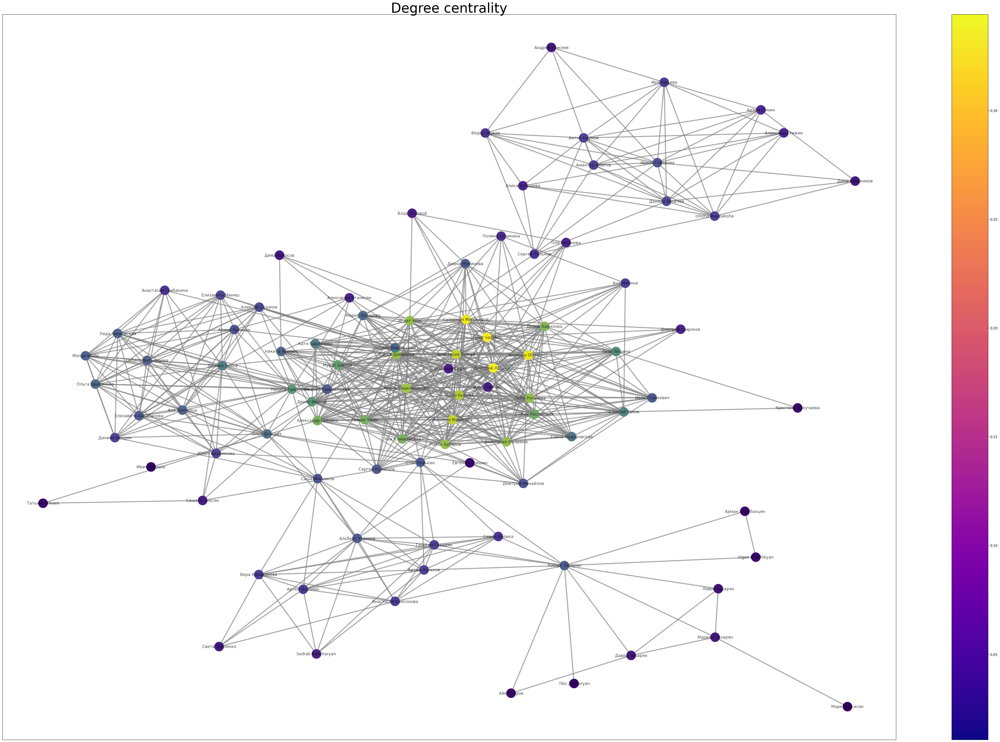

In [196]:
positions=nx.kamada_kawai_layout(G2)


plt.figure(figsize=(60,40))
# Plot it
nodes = nx.draw_networkx_nodes(G2, positions, node_size=750, cmap=plt.cm.plasma, 
                                   node_color=list(dc.values()),
                                   nodelist=dc.keys())

nx.draw_networkx(
    G2,positions, with_labels=True,node_color=list(dc.values()),nodelist=dc.keys(), node_size=750
    ,width = 3,
     alpha=0.7,
    edge_color="gray"
)
plt.colorbar(nodes)
plt.title("Degree centrality", fontsize=40)

plt.show()

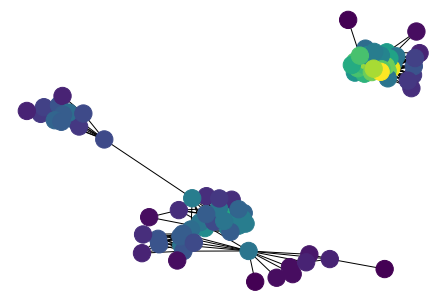

In [197]:
nx.draw(G2, with_labels = False,nodelist=dc.keys(),node_color=list(dc.values()))

In [198]:
cc = nx.centrality.closeness_centrality(G2)
df = pd.DataFrame(list(cc.items()), columns=['friend','closeness centrality'])
df = df.sort_values('closeness centrality', ascending=False)

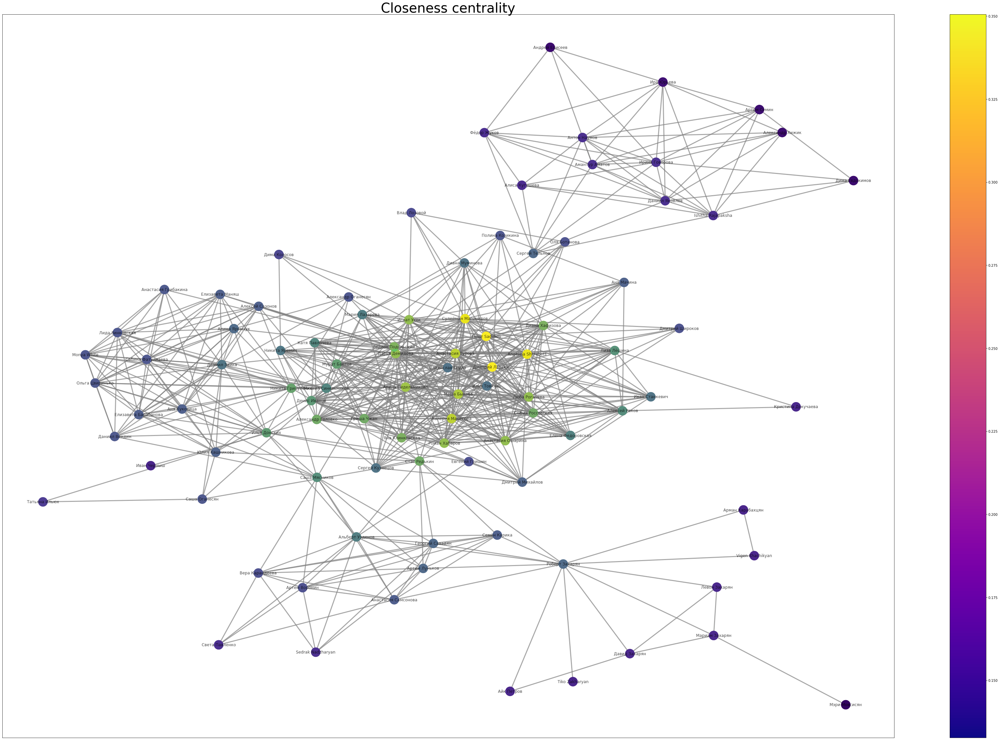

In [199]:
positions=nx.kamada_kawai_layout(G2)


plt.figure(figsize=(60,40))
# Plot it
nodes = nx.draw_networkx_nodes(G2, positions, node_size=750, cmap=plt.cm.plasma, 
                                   node_color=list(cc.values()),
                                   nodelist=cc.keys())

nx.draw_networkx(
    G2,positions, with_labels=True,node_color=list(cc.values()),nodelist=cc.keys(), node_size=750
    ,width = 3,
     alpha=0.7,
    edge_color="gray"
)
plt.colorbar(nodes)
plt.title("Closeness centrality", fontsize=40)

plt.show()

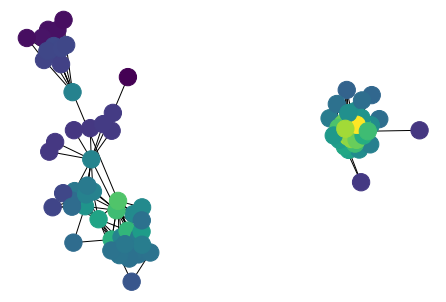

In [200]:
nx.draw(G2, with_labels = False,nodelist=cc.keys(),node_color=list(cc.values()))

In [201]:
bc = nx.centrality.betweenness_centrality(G2)
df = pd.DataFrame(list(bc.items()), columns=['friend','betweenness centrality'])
df = df.sort_values('betweenness centrality', ascending=False)

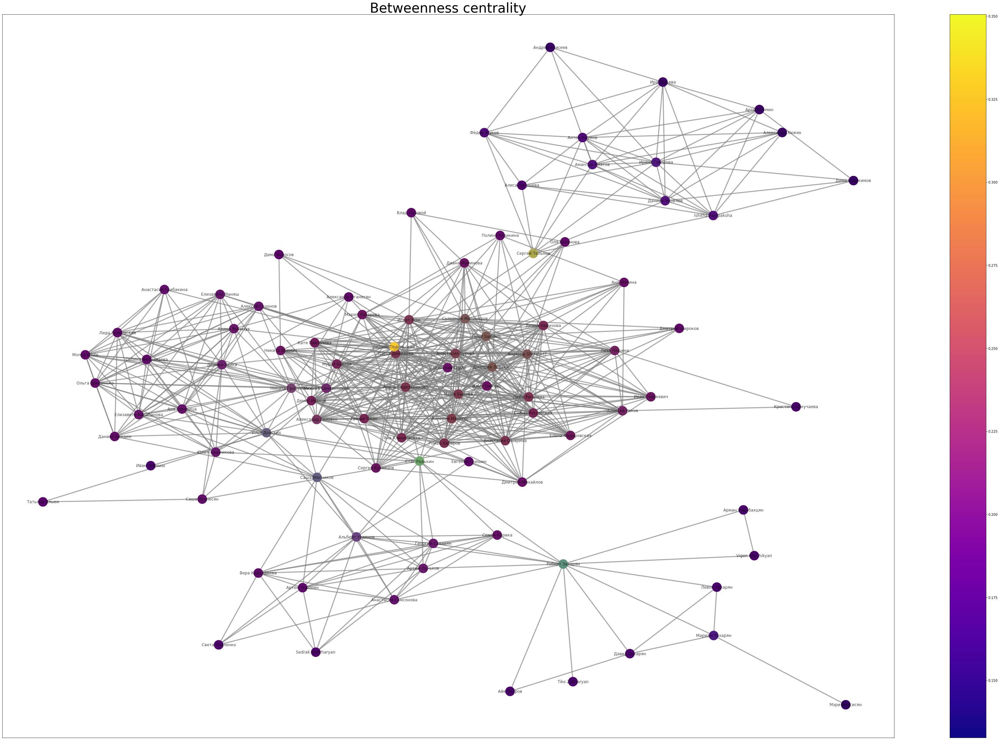

In [202]:
positions=nx.kamada_kawai_layout(G2)


plt.figure(figsize=(60,40))
# Plot it
nodes = nx.draw_networkx_nodes(G2, positions, node_size=750, cmap=plt.cm.plasma, 
                                   node_color=list(cc.values()),
                                   nodelist=bc.keys())

nx.draw_networkx(
    G2,positions, with_labels=True,node_color=list(bc.values()),nodelist=bc.keys(), node_size=750
    ,width = 3,
     alpha=0.7,
    edge_color="gray"
)
plt.colorbar(nodes)

plt.title("Betweenness centrality", fontsize=40)

plt.show()

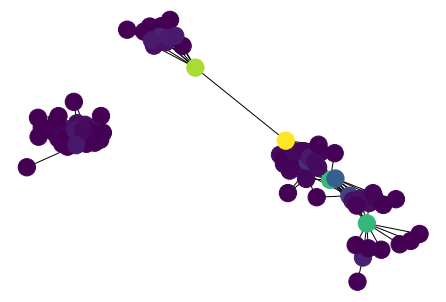

In [203]:
nx.draw(G2, with_labels = False,nodelist=bc.keys(),node_color=list(bc.values()))

From that nodes $\textbf{degree centrality}$ data can be seen, that people who have highest node degree centrality are my friends from my HSE bachelor program. That’s very logical, because they are the largest chunk of friends all in all. Its pretty interesting, that my best friend Timur Sadekov has the highest node degree centrality, meaning that we have the highest number of mutual friends.

As for the $\textbf{closeness centrality}$, it showed several surprising facts to me. First my former classmate Родион Подольский turned out to be my new masetry programm friend’s Сергей Тельнов friend. It was very
unexpectable, since one is my school buddy from hometown Stavropol and another is from Moscow. So, edge between them connects two major group of people in my life: before leaving my hometown and after that. That’s why, he has highest closeness centrality

A situation with $\textbf{betweenness centrality}$ is pretty close to closeness centrality. A person with very high betweenness centrality turned out to be my bachelor program teacher of linear algebra Дмитрий Широков. He
has a lot of mutual friends from my HSE bachelor program, but also he has one mutual friend from mastery program, who is connected to many others.

### Page rank

In [212]:
def transition_matrix(A):
  return A/np.sum(A, axis=1, keepdims=True)

def teleportation_vector(A):
    return np.ones(A.shape[0])/A.shape[0]

def update_rank(rank, P, v, alpha):
    return alpha*np.dot(P.T,rank) + (1-alpha)*v 

def page_rank(G, alpha, k):
    A = nx.to_numpy_array(G)
    P = transition_matrix(A)
    v = teleportation_vector(A)
    rank = np.ones(A.shape[0]) / A.shape[0]
    for _ in range(k):
        rank = update_rank(rank, P, v, alpha)
    return np.array(rank)

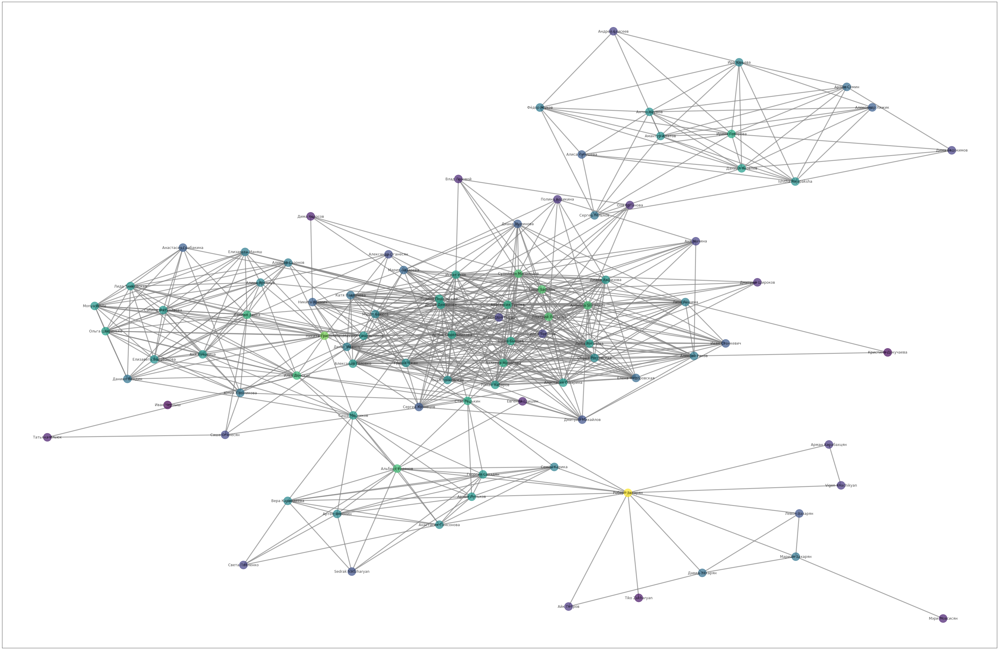

In [214]:
PR = page_rank(G2, 0.9, 10)

plt.figure(figsize=(60,40))

nx.draw_networkx(
    G2,positions, with_labels=True,node_color=PR,nodelist=bc.keys(), node_size=750
    ,width = 3,
     alpha=0.7,
    edge_color="gray"
)

A person with highest Page-Rank turned out to be my brother. It wasn’t unexpectable, since higher Page-Rank means higher authority and me and my brother have a lot of mutual friends. At the same time he is the only
friends with whom I have mutual friends and family members friends (which are not connected with anybody except themselves).

## Community detection

I am going to apply k-core decomposition from networkx to my graph and use nx.core_number and colorize every node by its k-shell.

In [204]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

In [205]:
labels = k_core_decompose(G2_sub)

In [206]:
pos = nx.kamada_kawai_layout(G2_sub)

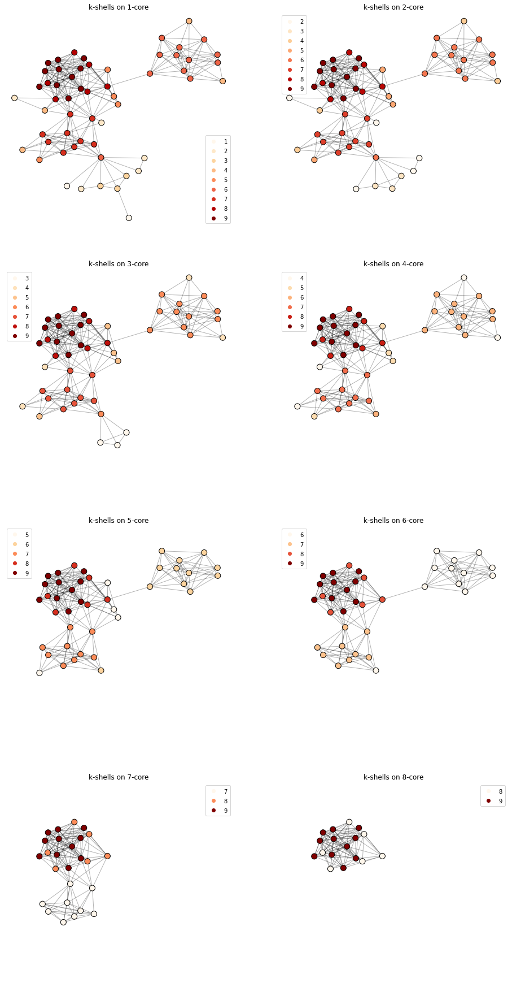

In [207]:
plt.figure(figsize=(8*2, 8*4))

x_max, y_max = np.array(list(pos.values())).max(axis=0)
x_min, y_min = np.array(list(pos.values())).min(axis=0)

for i in range(8):
    plt.subplot(4, 2, i+1)
    subG = nx.k_core(G2_sub, i+1)
    nodes = nx.draw_networkx_nodes(
        subG, 
        pos,
        cmap=plt.cm.OrRd,
        node_color=k_core_decompose(subG), 
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        subG, 
        pos,
        alpha=0.3,
        width=1, 
        edge_color='black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements())
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i+1))

### Girvan Newman algorithm

In [208]:
def edge_betweenness(G, n):
    G_copy = G.copy()
    con_comps = nx.number_connected_components(G_copy)
    res = []
    while con_comps <= n:
        edge_betweenness = nx.edge_betweenness_centrality(G_copy)
        cut_edge = sorted(edge_betweenness.keys(), key=lambda x: edge_betweenness[x])[-1]
        G_copy.remove_edge(*cut_edge)   
        if (nx.number_connected_components(G_copy)) > con_comps:
            iter_result = np.zeros((G_copy.number_of_nodes()))
            for idx, cc in enumerate(nx.connected_components(G_copy)):
                iter_result[np.isin(G.nodes, list(cc))] = idx
            res.append(iter_result)
            con_comps += 1
    return np.array(res)



In [209]:
labels = edge_betweenness(G2_sub, 6)
pos = nx.kamada_kawai_layout(G2_sub)

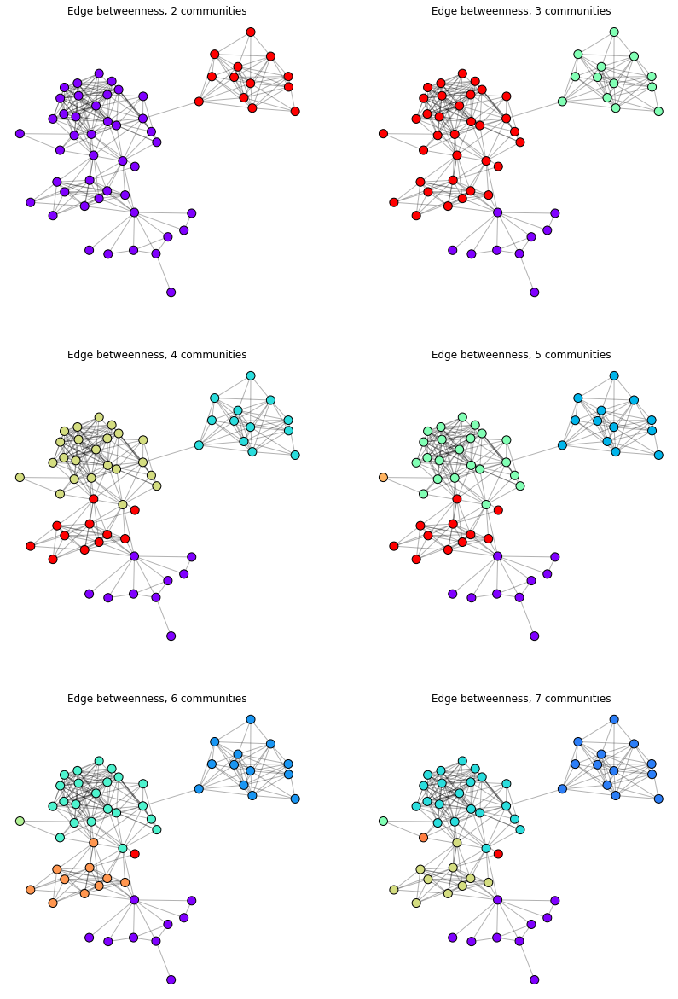

In [210]:
plt.figure(figsize=(7*2, 7*3))
colors = edge_betweenness(G2_sub, 6)
for i in range(colors.shape[0]):
    plt.subplot(3, 2, i+1)
    nx.draw_networkx_nodes(
        G2_sub, 
        pos,
        cmap=plt.cm.rainbow,
        node_color=colors[i], 
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(G2_sub, pos, alpha=0.3)
    plt.title('Edge betweenness, {} communities'.format(i+2))
    plt.axis('off')

The best community detection is done with 4 communities separation. All in all, Girvan Newman algorithm detected some communities pretty accurately.

In case of two communities, these are very accurately separated friends from my hometown and
friends from new city I live in.

In case of three communities, it is also very correct, since I can clearly see that friends from my new city are now sperated into friends from bachelor programm and friends from majestry programm.

The best community detection is done with 4 communities separation. In that case, my family members and friends are separated from previous group of people from my hometown. Also there are twogroups of friends: from school class and close friends from all over school.

Next five, six and seven community separation didn’t show any impressive results, since it just hightlited some people from groups who have little number of mutual friends. However, it is not enough to consider them separate communities. 